In [101]:
import numpy as np
# import cv2
import tifffile as tiff
from shapely.geometry import Polygon, mapping, shape, box
from skimage import io
from skimage.measure import label, regionprops
import matplotlib.pyplot as plt
# import json
from rasterio import features
import scanpy as sc
import pandas as pd
import geopandas as gpd

from matplotlib import colors

import pickle
import scipy

import seaborn as sns

# from SGanalysis.SGobject import SGobject

import matplotlib
%matplotlib inline
# matplotlib.use('Qt5Agg')
# %matplotlib qt

In [102]:
%load_ext autoreload
%autoreload 2

# from ../../software/SGanalysis.SGobject import SGobject

import sys
import os

# software_dir = '~/Documents/Penn/Research/software/'
# software_dir = os.path.expanduser(software_dir)

# sganalysis_path = f'{software_dir}/SGanalysis/SGobject.py'

sganalysis_path = '/Users/grantkinsler/Documents/Penn/Research/software/SGanalysis/SGanalysis/SGobject.py'
sys.path.append(os.path.dirname(os.path.expanduser(sganalysis_path)))
from SGobject import SGobject
# import figures as figures

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [103]:
# filepath  = '/Users/grantkinsler/RajLab Dropbox/Grant Kinsler/Shared_Grant/SpatialBarcodes/ImagingData/2024-02-27_spatialbarcodes_SG_expression/projects/2024-02-27_spatialbarcodes_expression/'
filepath = '/Users/grantkinsler/RajLab Dropbox/Grant Kinsler/SpatialBarcodes/ImagingData/2024-05-21_mouseexp_expression/projects/'

# roi_2
roi_name = 'roi_2'


# /roi_2

In [104]:
# locations = pd.read_csv(f'{filepath}{roi_name}/exports/cell_attributes_cell_10px_20240605.csv',index_col=0)
# matrix = pd.read_csv(f'{filepath}{roi_name}/exports/cell_by_gene_matrix_20240606_10px_cell.csv',index_col=0)

# matrix.set_index(matrix.index.astype(str),inplace=True)
# locations.set_index(matrix.index.astype(str),inplace=True)

# /Volumes/GRK_001/spatialbarcodes/2024-05-21_mouseexp_expression/projects/roi2/exports/
with open(f'{filepath}{roi_name}/exports/sg_object_20240604_dilate10.pkl', 'rb') as f:
    sg_obj = pickle.load(f)


In [105]:
# set object id (as string) as index

matrix = sg_obj.get_cell_gene_table_df()
matrix['object_id'] = [str(int(x)) for x in matrix['object_id']]
matrix.set_index('object_id',inplace=True)

sg_obj.gdf['object_id'] = [str(int(x)) for x in sg_obj.gdf['object_id']]
sg_obj.gdf.set_index('object_id',inplace=True)

No filtering available or applied.


In [106]:
sg_obj.gdf['nucleus_centroid'] = sg_obj.gdf['nucleus'].centroid.values
sg_obj.gdf['center_x'] = sg_obj.gdf['nucleus'].centroid.x.values
sg_obj.gdf['center_y'] = sg_obj.gdf['nucleus'].centroid.y.values
sg_obj.gdf['area'] = sg_obj.gdf['nucleus_dilated'].area.values

In [107]:
barcode_cols = ['bc_{:03d}'.format(i) for i in range(1,97)]

In [108]:
cutoff = 4

cell_barcodes = {}
# matrix.set_index('object_id',   inplace=True)
# df.set_index('object_id')

df = matrix

# df.sort_index(inplace=True)

df['cell_id'] = df.index

for cell_id in df['cell_id']:
    this_cell = df[df['cell_id']==cell_id]
    cell_barcodes[cell_id] = []

    for bc in barcode_cols:
        if this_cell[bc].values[0] > cutoff:
            cell_barcodes[cell_id].append(bc)

df['called_barcodes'] = cell_barcodes.values()
df['n_called_barcodes'] = [len(bc_set) for bc_set in cell_barcodes.values()]
df['barcode_names'] = ['-'.join(sorted(bc_set)) for bc_set in cell_barcodes.values()]

df = pd.merge(df,sg_obj.gdf,how='left',left_index=True,right_index=True)


In [109]:
df

,AKT1,AXL,BGN,BIRC3,BIRC5,BMP2,BMP4,CALD1,CAPG,CCNA2,...,cell_id,called_barcodes,n_called_barcodes,barcode_names,nucleus,nucleus_dilated,nucleus_centroid,center_x,center_y,area
object_id,,,,,,,,,,,,,,,,,,,,,
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,1,[],0,,"POLYGON ((23727.000 1097.000, 23741.000 1098.0...","POLYGON ((23723.193 1087.753, 23706.193 1094.7...",POINT (23747.880 1155.889),23747.879606,1155.889230,12083.909039
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,2,[],0,,"POLYGON ((23811.000 1166.000, 23822.000 1166.0...","POLYGON ((23807.286 1156.715, 23797.286 1160.7...",POINT (23806.278 1229.866),23806.277927,1229.866352,12327.850827
3,0.0,0.0,0.0,0.0,1.0,0.0,0.0,3.0,3.0,0.0,...,3,[],0,,"POLYGON ((19383.000 1449.000, 19398.000 1451.0...","POLYGON ((19378.528 1440.056, 19352.528 1453.0...",POINT (19365.232 1485.264),19365.232060,1485.264038,6440.407723
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,4,[],0,,"POLYGON ((19107.000 1506.000, 19137.000 1507.0...","POLYGON ((19091.029 1530.598, 19090.693 1531.3...",POINT (19129.721 1524.719),19129.720568,1524.718822,4279.403177
7,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,7,[],0,,"POLYGON ((15238.000 1549.000, 15252.000 1549.0...","POLYGON ((15236.760 1539.077, 15220.760 1541.0...",POINT (15196.783 1575.083),15196.782900,1575.083015,5458.813969
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67193,2.0,0.0,6.0,0.0,1.0,0.0,0.0,9.0,14.0,1.0,...,67193,[],0,,"POLYGON ((37771.000 46466.000, 37777.000 46470...","POLYGON ((37765.537 46457.624, 37742.537 46472...",POINT (37783.462 46544.912),37783.462010,46544.912100,13678.319345
67199,0.0,0.0,0.0,0.0,1.0,0.0,0.0,7.0,10.0,0.0,...,67199,[],0,,"POLYGON ((38215.000 46546.000, 38237.000 46547...","POLYGON ((38212.441 46536.333, 38179.699 46545...",POINT (38208.404 46576.996),38208.404034,46576.996025,9246.990769
67200,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,5.0,0.0,...,67200,[],0,,"POLYGON ((38366.000 46565.000, 38403.000 46566...","POLYGON ((38364.157 46555.171, 38332.157 46561...",POINT (38384.677 46598.134),38384.676549,46598.133528,10661.078562


In [110]:
sg_obj.gdf.index

Index(['1', '2', '3', '4', '7', '10', '8', '5', '6', '14',
       ...
       '67195', '67198', '67197', '67196', '67194', '67193', '67199', '67200',
       '67201', '67202'],
      dtype='object', name='object_id', length=67202)

In [111]:
gene_cols = [col for col in df.columns if 'bc_' not in col and col not in ['cell_id','called_barcodes','n_called_barcodes','barcode_names','area','center_x','center_y','nucleus','nucleus_centroid','nucleus_dilated']]    

In [112]:
gene_cols

['AKT1',
 'AXL',
 'BGN',
 'BIRC3',
 'BIRC5',
 'BMP2',
 'BMP4',
 'CALD1',
 'CAPG',
 'CCNA2',
 'CCND1',
 'CD36',
 'CDK1',
 'CDKN1A',
 'CDKN1B',
 'COL1A1',
 'COL5A2',
 'COL9A3',
 'CTNNB1',
 'DCN',
 'DKK3',
 'EGFR',
 'ENSMUSG00000071361',
 'ERBB3',
 'ESPN',
 'FGF1',
 'FGFR1',
 'FN1',
 'FOS',
 'FOSB',
 'FOSL1',
 'FOSL2',
 'FOXF2',
 'GFP',
 'GPX8',
 'GTSE1',
 'HIF1A',
 'HK2',
 'IFIT2',
 'IGFBP7',
 'IRX3',
 'ITGA3',
 'ITGA5',
 'ITGA6',
 'ITGA8',
 'ITGAV',
 'JUN',
 'KIT',
 'KLF4',
 'L1CAM',
 'LMOD1',
 'LOXL2',
 'MAPK14',
 'MEF2C',
 'MERTK',
 'MET',
 'MITF',
 'MKI67',
 'MLANA',
 'MMP1',
 'MMP11',
 'MT-RNR2',
 'MYBL2',
 'MYC',
 'MYLK',
 'MYOCD',
 'NANOG',
 'NCAM1',
 'NFATC2',
 'NFE2L2',
 'NGFR',
 'NOTCH3',
 'NOTCH4',
 'NRG1',
 'NT5E',
 'OASL',
 'PDGFA',
 'PDGFC',
 'PDGFRB',
 'PKDCC',
 'PRKCA',
 'PRRX1',
 'RGS2',
 'RIGI',
 'ROR1',
 'ROR2',
 'RUNX2',
 'SCG2',
 'SERPINE1',
 'SERPINF1',
 'SFRP1',
 'SFRP4',
 'SLC7A8',
 'SLIT2',
 'SMAD3',
 'SNAI1',
 'SNAI2',
 'SOX10',
 'SOX2',
 'SOX9',
 'SPARC',
 'TAF

<AxesSubplot: >

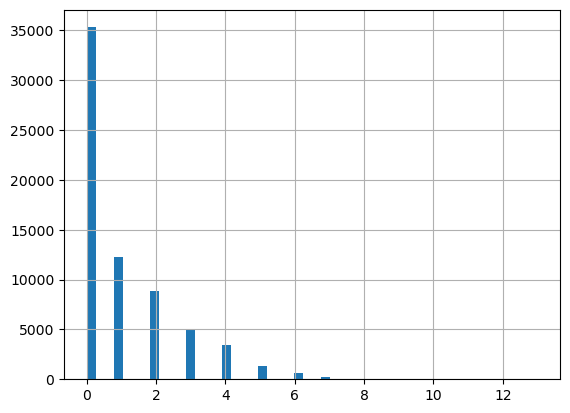

In [113]:
df['n_called_barcodes'].hist(bins=50)

In [114]:
adata_genes = sc.AnnData(df[gene_cols])

cols= ['cell_id','n_called_barcodes','barcode_names','called_barcodes','area','center_x','center_y']
# for col in :
#     adata_genes.obs[col] = df[col]

adata_genes.obs = df[cols]

In [115]:
adata_genes.obs['area']

object_id
1        12083.909039
2        12327.850827
3         6440.407723
4         4279.403177
7         5458.813969
             ...     
67193    13678.319345
67199     9246.990769
67200    10661.078562
67201     8041.815355
67202     6580.028514
Name: area, Length: 67202, dtype: float64

In [116]:
adata_genes.var_names

Index(['AKT1', 'AXL', 'BGN', 'BIRC3', 'BIRC5', 'BMP2', 'BMP4', 'CALD1', 'CAPG',
       'CCNA2',
       ...
       'TRPM1', 'TYR', 'VCAM1', 'VEGFA', 'VEGFC', 'VGF', 'WNT5A', 'YAP1',
       'ZEB1', 'ZEB2'],
      dtype='object', length=119)

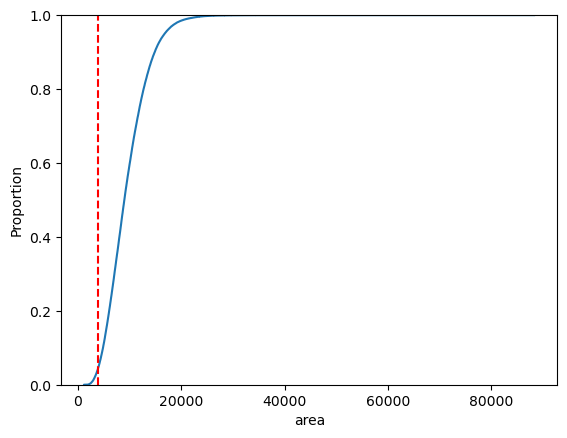

In [117]:
sns.ecdfplot(adata_genes.obs['area'],complementary=False)
plt.axvline(4000,color='red',linestyle='--')

In [118]:
min_area = 2000

adata_genes = adata_genes[adata_genes.obs['area']>min_area]

(0.0, 20000.0)

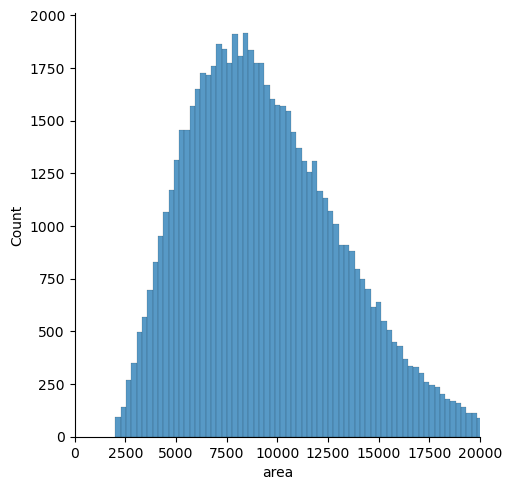

In [119]:
sns.displot(adata_genes.obs['area'])
plt.xlim(0,20000)

In [123]:
sc.pp.calculate_qc_metrics(adata_genes,percent_top=None,log1p=False,inplace=True)

In [124]:
adata_genes

AnnData object with n_obs × n_vars = 67174 × 119
    obs: 'cell_id', 'n_called_barcodes', 'barcode_names', 'called_barcodes', 'area', 'center_x', 'center_y', 'n_genes_by_counts', 'total_counts'
    var: 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

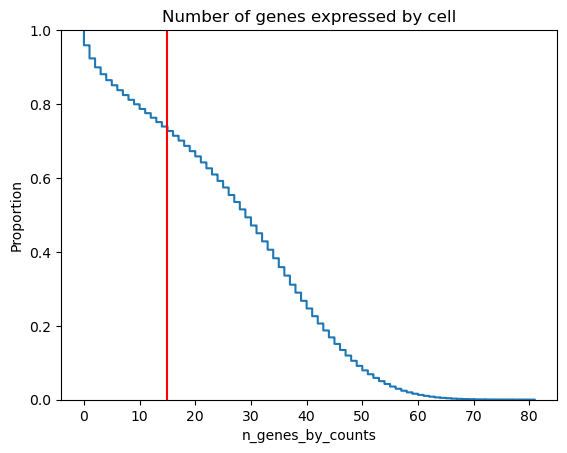

<Figure size 640x480 with 0 Axes>

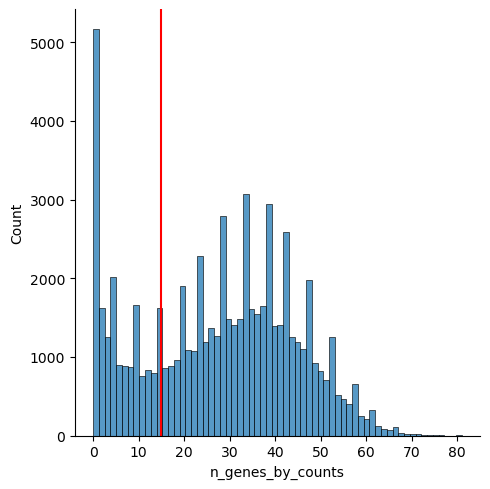

<Figure size 640x480 with 0 Axes>

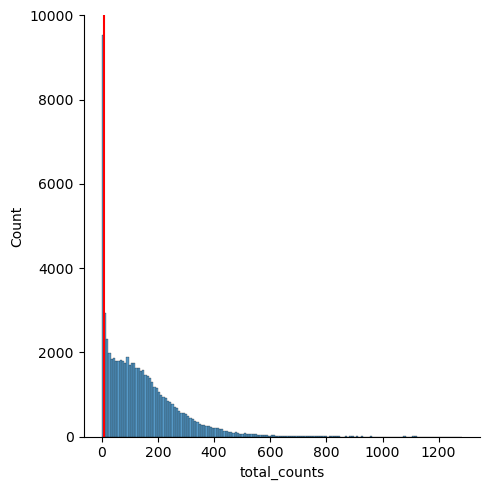

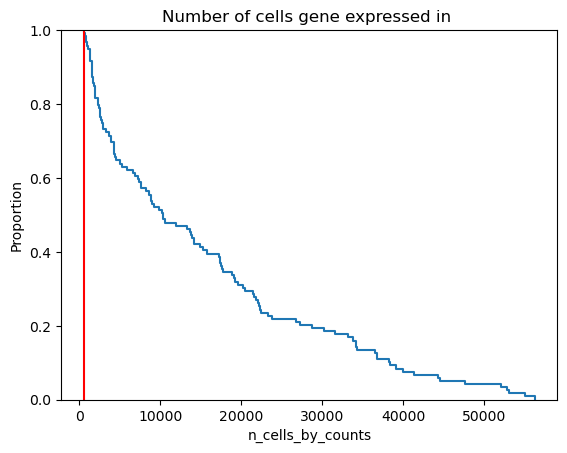

In [125]:


plt.figure()
plt.title('Number of genes expressed by cell')
sns.ecdfplot(adata_genes.obs['n_genes_by_counts'],complementary=True)
plt.axvline(15,color='r')
plt.figure()
sns.displot(adata_genes.obs['n_genes_by_counts'])
plt.axvline(15,color='r')


plt.figure()
sns.displot(adata_genes.obs['total_counts'])
plt.axvline(10,color='r')

plt.figure()
# sns.displot(adata_genes.var['n_cells_by_counts'])
plt.title('Number of cells gene expressed in ')
sns.ecdfplot(adata_genes.var['n_cells_by_counts'],complementary=True)
plt.axvline(500,color='r')

# plt.figure()
# sns.displot(adata_genes.obs['total_counts'])
# plt.axvline(10,color='r')



# sns.displot()

In [126]:
# filter cells and genes by number of occurences 
sc.pp.filter_cells(adata_genes, min_genes=15) # keep only cells that have at least 10 genes
sc.pp.filter_genes(adata_genes, min_cells=500) # keep only genes that are expressed in at least 500 cells

In [127]:
sc.pp.normalize_total(adata_genes) # normalize with total number of (non-barcode) spots per cell 
sc.pp.scale(adata_genes) # scale genes across cells

# sc.pp.highly_variable_genes(adata_genes, n_top_genes=30)

## seurat v3 normalization is applied to the counts directly, 
# sc.pp.highly_variable_genes(adata_genes,n_top_genes=30,flavor='seurat_v3')
# sc.pp.highly_variable_genes(adata_genes, min_mean=0.0125, max_mean=3, min_disp=0.5,flavor='seurat_v3')
# sc.pp.pca(adata_genes)

# sc.pp.highly_variable_genes(adata_genes,n_top_genes=30,flavor='seurat_v3')

/Users/grantkinsler/miniforge3/envs/spatialgenomics-env2/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  cax = scatter(


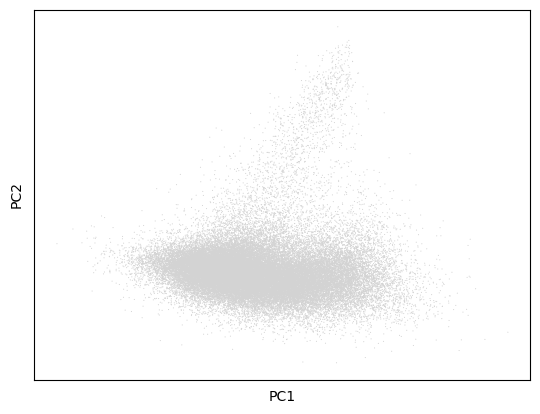

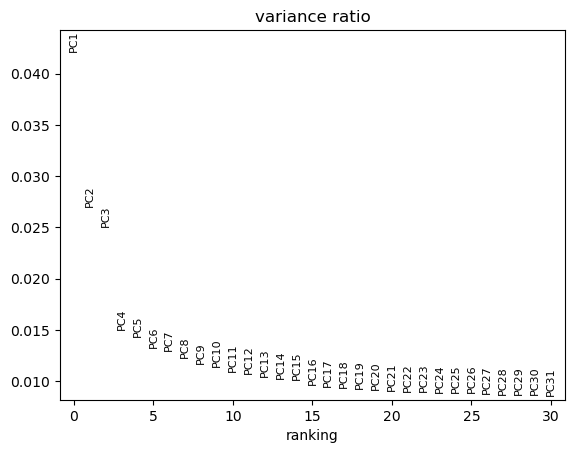

In [128]:
sc.pp.pca(adata_genes)
sc.pl.pca(adata_genes)
sc.pl.pca_variance_ratio(adata_genes, log=False)

In [129]:
sc.pp.neighbors(adata_genes)
# sc.pp.scale(adata_genes)
sc.tl.umap(adata_genes)
sc.tl.leiden(adata_genes, n_iterations=-1)

/Users/grantkinsler/miniforge3/envs/spatialgenomics-env2/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


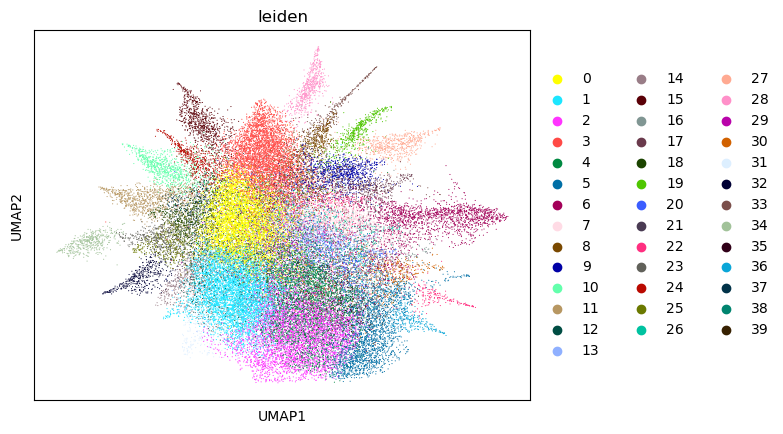

In [130]:
sc.pl.umap(adata_genes, color=["leiden"])

In [132]:
cell_cycle_genes = [x.strip() for x in open('../data/regev_lab_cell_cycle_genes.txt')]
s_genes = cell_cycle_genes[:43]
g2m_genes = cell_cycle_genes[43:]
cell_cycle_genes = [x for x in cell_cycle_genes if x in adata_genes.var_names]

In [149]:
cell_cycle_genes

['CDK1', 'BIRC5', 'TOP2A', 'MKI67', 'GTSE1']

In [147]:
sc.tl.score_genes(adata_genes,cell_cycle_genes,score_name='g2m_score')

/Users/grantkinsler/miniforge3/envs/spatialgenomics-env2/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


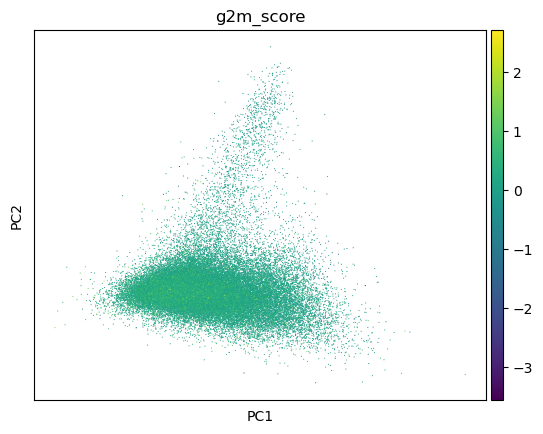

In [148]:
sc.pl.pca(adata_genes,color='g2m_score')

In [135]:
sc.pp.regress_out(adata_genes, ['g2m_score'])
sc.pp.scale(adata_genes)

/Users/grantkinsler/miniforge3/envs/spatialgenomics-env2/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  cax = scatter(


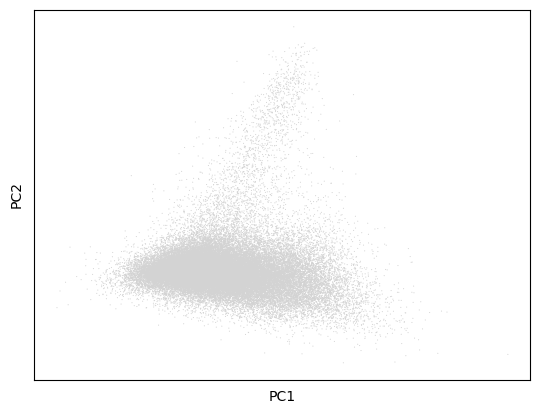

In [136]:
# I feel like this is supposed to be different after regressing out the cell cycle genes... 
sc.pp.pca(adata_genes)
sc.pl.pca(adata_genes)

In [33]:
sc.pp.neighbors(adata_genes)
# sc.pp.scale(adata_genes)
sc.tl.umap(adata_genes)
# sc.tl.leiden(adata_genes, n_iterations=-1)

In [34]:
res_list = [0.01,0.05,0.1,0.25, 0.5, 1.0]
for res in res_list:
    sc.tl.leiden(
        adata_genes, key_added=f"leiden_res_{res:4.2f}", resolution=res, random_state=42
    )


/Users/grantkinsler/miniforge3/envs/spatialgenomics-env2/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/grantkinsler/miniforge3/envs/spatialgenomics-env2/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/grantkinsler/miniforge3/envs/spatialgenomics-env2/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/grantkinsler/miniforge3/envs/spatialgenomics-env2/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/grantkinsler/miniforge3/envs/spatialgenomics-env2

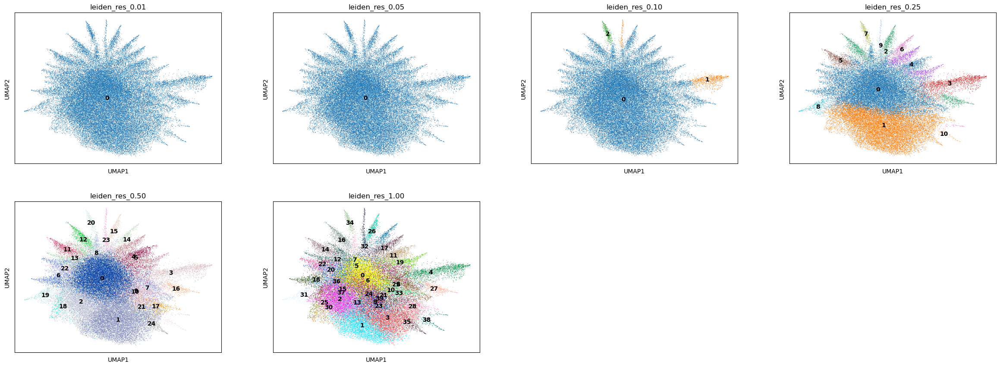

In [35]:
sc.pl.umap(
    adata_genes,
    color=[f"leiden_res_{res:4.2f}" for res in res_list],
    legend_loc="on data",
)

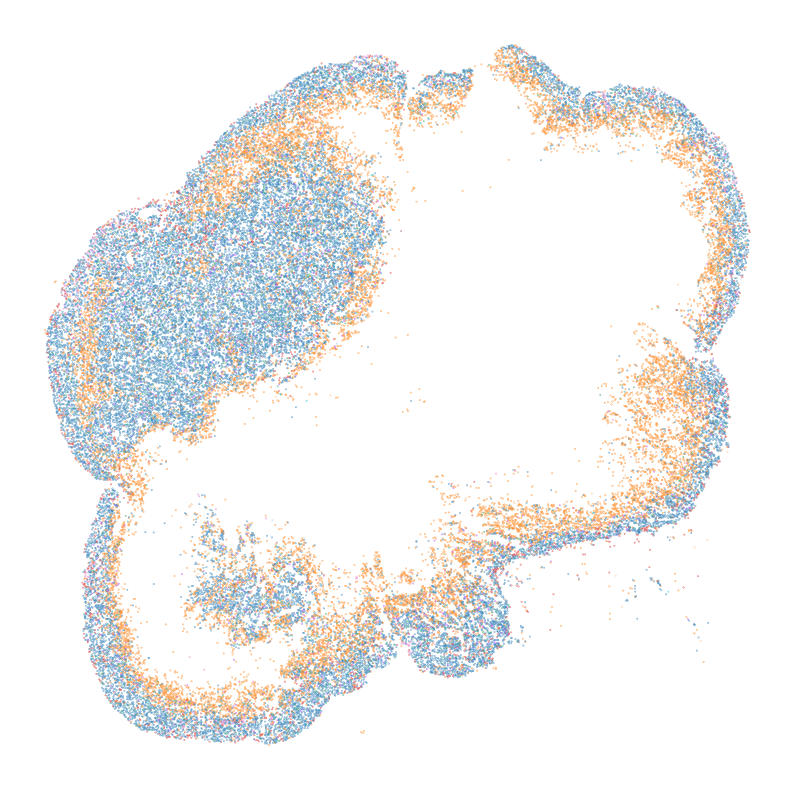

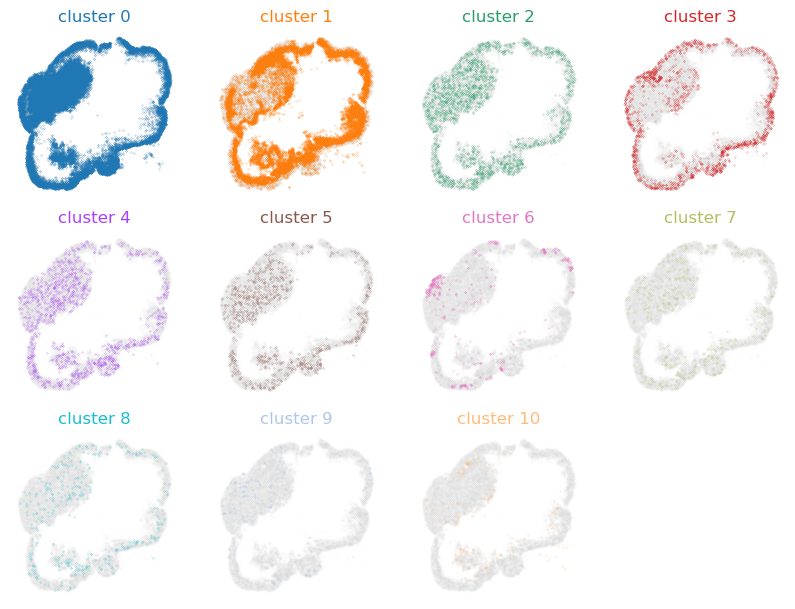

In [36]:
res_to_use = 0.25

c_dict = {str(x):c for x,c in enumerate(adata_genes.uns[f'leiden_res_{res_to_use:4.2f}_colors'])}
c_list =[c_dict[x] for x in adata_genes.obs[f'leiden_res_{res_to_use:4.2f}']]

fig,ax = plt.subplots(1,1,figsize=(10,10))
plt.scatter(adata_genes.obs['center_x'],adata_genes.obs['center_y'],marker='.',
            c=c_list,
            s=0.2)
plt.axis('off')

plt.figure(figsize=(10,10))
for cluster in np.unique(adata_genes.obs[f'leiden_res_{res_to_use:4.2f}']):
    plt.subplot(4,4,int(cluster)+1)
    plt.title(f'cluster {cluster}',color=c_dict[str(cluster)])
    not_cluster = adata_genes[adata_genes.obs[f'leiden_res_{res_to_use:4.2f}']!=str(cluster)]
    plt.scatter(not_cluster.obs['center_x'],not_cluster .obs['center_y'],marker='.',
                c='gray',
                s=0.1,alpha=0.01)
    
    this_cluster = adata_genes[adata_genes.obs[f'leiden_res_{res_to_use:4.2f}']==str(cluster)]
    plt.scatter(this_cluster.obs['center_x'],this_cluster.obs['center_y'],marker='.',
                c=c_dict[str(cluster)],
                s=0.1)
    plt.axis('off')
    

/Users/grantkinsler/miniforge3/envs/spatialgenomics-env2/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/grantkinsler/miniforge3/envs/spatialgenomics-env2/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/grantkinsler/miniforge3/envs/spatialgenomics-env2/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/grantkinsler/miniforge3/envs/spatialgenomics-env2/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/grantkinsler/miniforge3/envs/spatialgenomics-env2/lib/python3.9/site-packages

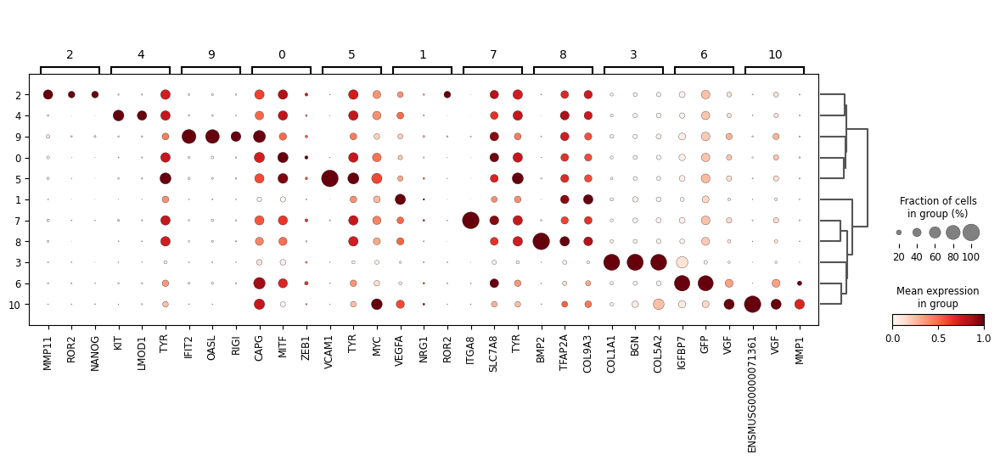

In [37]:
sc.tl.rank_genes_groups(adata_genes, groupby=f"leiden_res_{res_to_use:4.2f}", method="wilcoxon")

sc.pl.rank_genes_groups_dotplot(
    adata_genes, groupby=f"leiden_res_{res_to_use:4.2f}", standard_scale="var", n_genes=3
)

In [100]:
adata_genes[adata_genes.obs[f'leiden_res_{res_to_use:4.2f}']=='6'].obs['barcode_names']

KeyError: 'leiden_res_0.25'

In [137]:
min_number_barcodes = 1

name,count = np.unique(adata_genes.obs[adata_genes.obs['n_called_barcodes']>=min_number_barcodes]['barcode_names'].values,return_counts=True)

common_bc_combos = {}

min_number_cells = 10

for n,c in zip(name,count):
    if c > min_number_cells:
        # print(n,c)
        common_bc_combos[n] = c
    # print(n,c)  


(-648.8675447522292, 59258.76371243313, -771.1445560851262, 48869.84452242345)

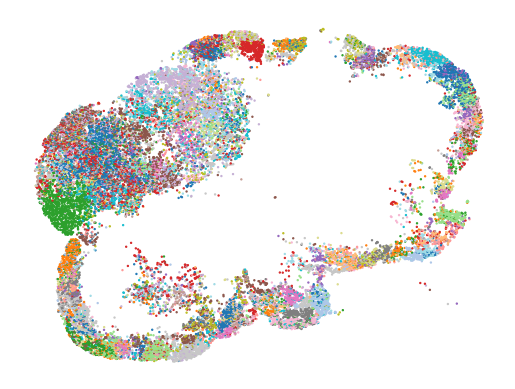

In [138]:
bc_colors = sns.color_palette('tab20',n_colors=len(common_bc_combos))
bc_color_dict = {bc:bc_colors[i] for i,bc in enumerate(common_bc_combos.keys())}

bc_color_list = [colors.to_rgba(bc_color_dict[bc],alpha=1.0) if bc in bc_color_dict.keys() else colors.to_rgba('gray',alpha=0.0)  for bc in adata_genes.obs['barcode_names'] ]

plt.scatter(adata_genes.obs['center_x'],adata_genes.obs['center_y'],marker='o',
            c=bc_color_list,
            s=0.5)


plt.axis('off')

There are some pockets of cells that appear to have mixed barcode identities - are these real or just doubleets?

In [139]:
# top 16 barcodes:
min_number_barcodes = 3
name,count = np.unique(adata_genes.obs[adata_genes.obs['n_called_barcodes']>=min_number_barcodes]['barcode_names'].values,return_counts=True)

very_common_bcs = name[np.argsort(count)[::-1][:16]]

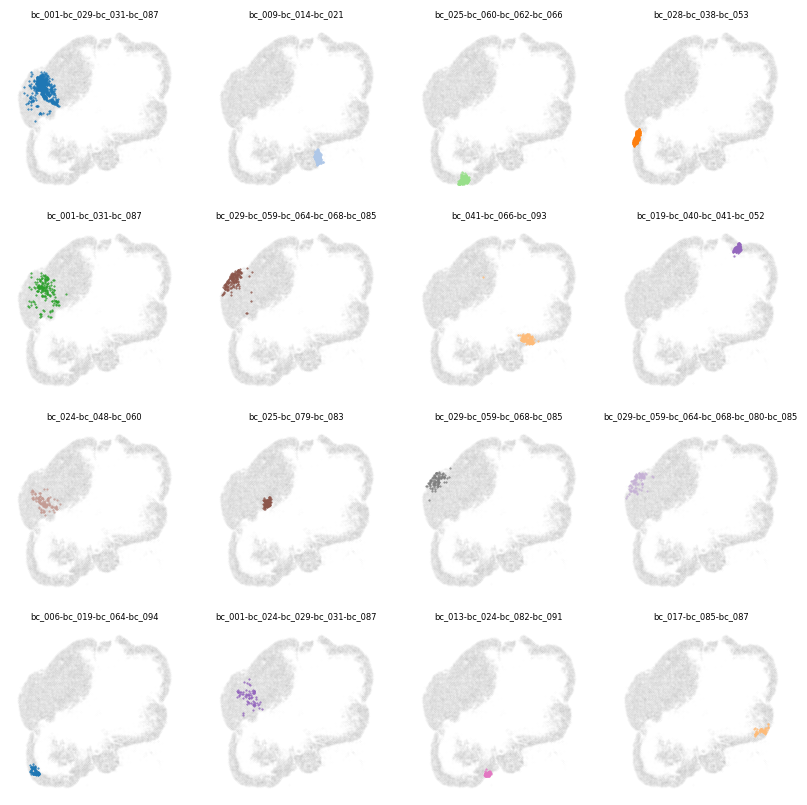

In [140]:
# very_common_bcs = ['bc_001-bc_024-bc_029-bc_031-bc_087',
#  'bc_001-bc_029-bc_031-bc_087',
#  'bc_007-bc_025-bc_027',
#  'bc_009-bc_014-bc_021',
#  'bc_009-bc_020-bc_091',
#  'bc_017-bc_085-bc_087',
#  'bc_019-bc_040-bc_041-bc_052',
#  'bc_024-bc_048-bc_060',
#  'bc_025-bc_060-bc_062-bc_066',
#  'bc_028-bc_038-bc_053',
#  'bc_029-bc_032-bc_059-bc_064-bc_068-bc_080-bc_085',
#  'bc_029-bc_059-bc_064-bc_068-bc_080-bc_085',
#  'bc_029-bc_059-bc_064-bc_068-bc_085',
#  'bc_041-bc_066-bc_080-bc_093',
#  'bc_041-bc_066-bc_093',
#  'bc_050-bc_065-bc_089']

plt.figure(figsize=(10,10))
for i,bc_name in enumerate(very_common_bcs):
    
    plt.subplot(4,4,i+1)
    plt.title(bc_name,fontsize=6)

    others = adata_genes[adata_genes.obs['barcode_names']!=bc_name]
    plt.scatter(others.obs['center_x'],others.obs['center_y'],marker='o',
            color='gray',alpha=0.01,
            s=0.1)

    this_bc = adata_genes[adata_genes.obs['barcode_names']==bc_name]

    plt.scatter(this_bc.obs['center_x'],this_bc.obs['center_y'],marker='o',
            color=bc_color_dict[bc_name],alpha=1.0,
            s=0.25)
    
    plt.axis('off')
    

In [43]:
adata_genes.obs['_id'] 

KeyError: '_id'

In [44]:
def get_polygons_around_polygon(sg_obj,identifier,id_field='object_id',image_scale=5):

    polygon_gdf = sg_obj.gdf[sg_obj.gdf[id_field] == identifier]

    first_polygon_geometry = polygon_gdf.geometry.iloc[0]

    minx, miny, maxx, maxy = first_polygon_geometry.bounds
    dx = (maxx - minx) * 0.5 * image_scale
    dy = (maxy - miny) * 0.5 * image_scale
    expanded_bbox = box(minx - dx, miny - dy, maxx + dx, maxy + dy)

    other_polygons = sg_obj.gdf[sg_obj.gdf.geometry.intersects(expanded_bbox) & (sg_obj.gdf[id_field] != identifier)]

    return other_polygons

def get_polygon_barcodes(df,identifier,id_field='cell_id'):

    if len(df[df[id_field]==identifier]['called_barcodes'].values) > 0:

        return df[df[id_field]==identifier]['called_barcodes'].values[0]

    else:
        return []

def get_all_barcodes_in_region(df,identifiers,id_field='cell_id'):

    bc_list = []

    for identifier in identifiers:
        bc_list += get_polygon_barcodes(df,identifier,id_field=id_field)

    return bc_list



In [45]:
sg_obj.gdf['object_id'] = sg_obj.gdf.index

In [46]:
# Let's unpack the bc041-bc066-bc093 barcode combo which is next to a bunch of bc041-bc066-bc080-bc093 cells and see what's going on there
entries_here = df[df['barcode_names'].isin([
    'bc_001-bc_024-bc_029-bc_031-bc_087',
                            #  'bc_001-bc_031-bc_087'
                             ])][['bc_001','bc_024','bc_029','bc_031','bc_087']]



In [53]:
# df[df['barcode_names'].isin([
#     'bc_001-bc024-bc_029-bc_031-bc_087',
#                             #  'bc_001-bc_031-bc_087'
#                              ])]

In [54]:
# Let's unpack the bc041-bc066-bc093 barcode combo which is next to a bunch of bc041-bc066-bc080-bc093 cells and see what's going on there
entries_here = df[df['barcode_names'].isin([
    'bc_001-bc_029-bc_031-bc_087',
                            #  'bc_001-bc_031-bc_087'
                             ])][['bc_001','bc_029','bc_031','bc_087']]



In [55]:
np.mean(entries_here,axis=0)

bc_001    13.651119
bc_029     8.141791
bc_031    14.727612
bc_087    24.093283
dtype: float32

In [56]:
np.sum(entries_here,axis=0)/np.sum(entries_here.values,axis=None)

bc_001    0.225215
bc_029    0.134322
bc_031    0.242975
bc_087    0.397488
dtype: float32

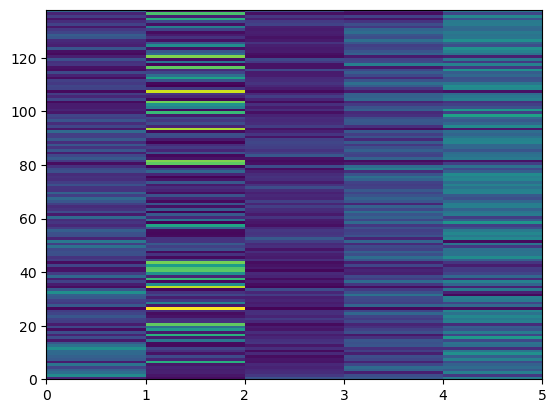

In [52]:
plt.pcolormesh(entries_here.values/np.sum(entries_here.values,axis=1)[:,np.newaxis])



In [53]:
bc_list = ['bc_001','bc_024','bc_029','bc_031','bc_087']

# import  as comb
bcs_here = []
bcs_here.append('-'.join(bc_list))
for c in itertools.combinations(bc_list,4):
    bcs_here.append('-'.join(c))

for c in itertools.combinations(bc_list,3):
    bcs_here.append('-'.join(c))

for c in itertools.combinations(bc_list,2):
    bcs_here.append('-'.join(c))

for c in itertools.combinations(bc_list,1):
    bcs_here.append('-'.join(c))

plt.figure(figsize=(2*5,2*8))
for i,bc_name in enumerate(bcs_here):
    
    # plt.subplot(6,6,i+1)
    if i == 0:
        plt.subplot(8,5,i+1)
    else:
        plt.subplot(8,5,i+5)
    plt.title(bc_name,fontsize=6)

    others = adata_genes[adata_genes.obs['barcode_names']!=bc_name]
    plt.scatter(others.obs['center_x'],others.obs['center_y'],marker='o',
            color='gray',alpha=0.01,
            s=0.1)

    this_bc = adata_genes[adata_genes.obs['barcode_names']==bc_name]

    plt.scatter(this_bc.obs['center_x'],this_bc.obs['center_y'],marker='o',
            color='k',alpha=1.0,
            s=0.25)
    
    plt.axis('off')

NameError: name 'itertools' is not defined

In [146]:
sg_obj.gdf

,nucleus,nucleus_dilated,nucleus_centroid,center_x,center_y,area,cell_id
object_id,,,,,,,
1,"POLYGON ((23727.000 1097.000, 23741.000 1098.0...","POLYGON ((23723.193 1087.753, 23706.193 1094.7...",POINT (23747.880 1155.889),23747.879606,1155.889230,12083.909039,1
2,"POLYGON ((23811.000 1166.000, 23822.000 1166.0...","POLYGON ((23807.286 1156.715, 23797.286 1160.7...",POINT (23806.278 1229.866),23806.277927,1229.866352,12327.850827,2
3,"POLYGON ((19383.000 1449.000, 19398.000 1451.0...","POLYGON ((19378.528 1440.056, 19352.528 1453.0...",POINT (19365.232 1485.264),19365.232060,1485.264038,6440.407723,3
4,"POLYGON ((19107.000 1506.000, 19137.000 1507.0...","POLYGON ((19091.029 1530.598, 19090.693 1531.3...",POINT (19129.721 1524.719),19129.720568,1524.718822,4279.403177,4
7,"POLYGON ((15238.000 1549.000, 15252.000 1549.0...","POLYGON ((15236.760 1539.077, 15220.760 1541.0...",POINT (15196.783 1575.083),15196.782900,1575.083015,5458.813969,7
...,...,...,...,...,...,...,...
67193,"POLYGON ((37771.000 46466.000, 37777.000 46470...","POLYGON ((37765.537 46457.624, 37742.537 46472...",POINT (37783.462 46544.912),37783.462010,46544.912100,13678.319345,67193
67199,"POLYGON ((38215.000 46546.000, 38237.000 46547...","POLYGON ((38212.441 46536.333, 38179.699 46545...",POINT (38208.404 46576.996),38208.404034,46576.996025,9246.990769,67199
67200,"POLYGON ((38366.000 46565.000, 38403.000 46566...","POLYGON ((38364.157 46555.171, 38332.157 46561...",POINT (38384.677 46598.134),38384.676549,46598.133528,10661.078562,67200


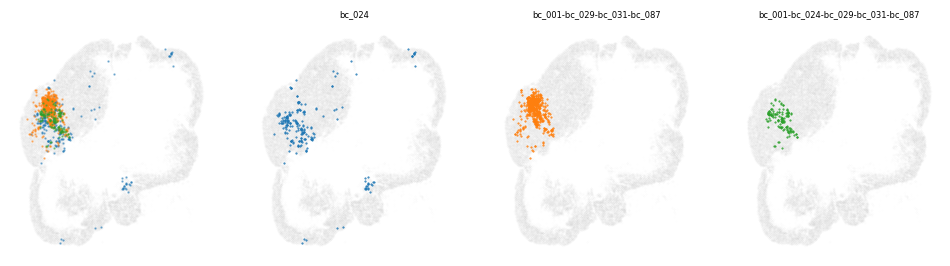

In [54]:
bcs_here = ['bc_024','bc_001-bc_029-bc_031-bc_087','bc_001-bc_024-bc_029-bc_031-bc_087',]

color_list = ['b','r','purple']

plt.figure(figsize=(3*4,1*3))

plt.subplot(1,4,1)
# plt.title(bc_name,fontsize=6)

others = adata_genes[~adata_genes.obs['barcode_names'].isin(bcs_here)]
plt.scatter(others.obs['center_x'],others.obs['center_y'],marker='o',
        color='gray',alpha=0.01,
        s=0.1)


for i,bc_name in enumerate(bcs_here):
    this_bc = adata_genes[adata_genes.obs['barcode_names']==bc_name]

    plt.scatter(this_bc.obs['center_x'],this_bc.obs['center_y'],marker='o',
            color=sns.color_palette()[i],alpha=0.5,
            s=0.5)

plt.axis('off')


for i,bc_name in enumerate(bcs_here):
    
    plt.subplot(1,4,i+2)
    # if i == 0:
    #     plt.subplot(8,5,i+1)
    # else:
    #     plt.subplot(8,5,i+5)
    plt.title(bc_name,fontsize=6)

    others = adata_genes[adata_genes.obs['barcode_names']!=bc_name]
    plt.scatter(others.obs['center_x'],others.obs['center_y'],marker='o',
            color='gray',alpha=0.01,
            s=0.1)

    this_bc = adata_genes[adata_genes.obs['barcode_names']==bc_name]

    plt.scatter(this_bc.obs['center_x'],this_bc.obs['center_y'],marker='o',
            color=sns.color_palette()[i],alpha=1.0,
            s=0.25)
    
    plt.axis('off')



In [51]:
adata_genes.obs[adata_genes.obs['barcode_names'].isin([
    'bc_001-bc_024-bc_029-bc_031-bc_087'])]

,cell_id,n_called_barcodes,barcode_names,called_barcodes,area,center_x,center_y,n_genes_by_counts,total_counts,n_genes,leiden,g2m_score,leiden_res_0.01,leiden_res_0.05,leiden_res_0.10,leiden_res_0.25,leiden_res_0.50,leiden_res_1.00
object_id,,,,,,,,,,,,,,,,,,
29564,29564,5,bc_001-bc_024-bc_029-bc_031-bc_087,"[bc_001, bc_024, bc_029, bc_031, bc_087]",12856.921973,12391.086484,22480.543334,NaN,NaN,48,23,-0.274710,0,0,0,0,0,28
30051,30051,5,bc_001-bc_024-bc_029-bc_031-bc_087,"[bc_001, bc_024, bc_029, bc_031, bc_087]",10433.767761,10001.705307,22800.068966,NaN,NaN,43,0,0.339300,0,0,0,0,0,0
30324,30324,5,bc_001-bc_024-bc_029-bc_031-bc_087,"[bc_001, bc_024, bc_029, bc_031, bc_087]",9487.642970,10267.698952,22952.495273,NaN,NaN,36,38,-0.120228,0,0,0,0,0,0
31579,31579,5,bc_001-bc_024-bc_029-bc_031-bc_087,"[bc_001, bc_024, bc_029, bc_031, bc_087]",11704.779091,11529.930717,23711.632916,NaN,NaN,38,21,-0.185168,0,0,0,0,18,25
31734,31734,5,bc_001-bc_024-bc_029-bc_031-bc_087,"[bc_001, bc_024, bc_029, bc_031, bc_087]",7285.985345,11192.661804,23811.705568,NaN,NaN,30,0,-0.328186,0,0,0,0,0,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45816,45816,5,bc_001-bc_024-bc_029-bc_031-bc_087,"[bc_001, bc_024, bc_029, bc_031, bc_087]",14214.875896,12292.355578,32067.612981,NaN,NaN,60,9,-0.355308,0,0,0,0,0,5
45991,45991,5,bc_001-bc_024-bc_029-bc_031-bc_087,"[bc_001, bc_024, bc_029, bc_031, bc_087]",5602.493374,9098.710343,32139.687934,NaN,NaN,40,7,-0.315256,0,0,0,0,0,8
46484,46484,5,bc_001-bc_024-bc_029-bc_031-bc_087,"[bc_001, bc_024, bc_029, bc_031, bc_087]",20750.813384,11670.624486,32469.325362,NaN,NaN,63,3,1.337124,0,0,0,0,0,5


No filtering available or applied.


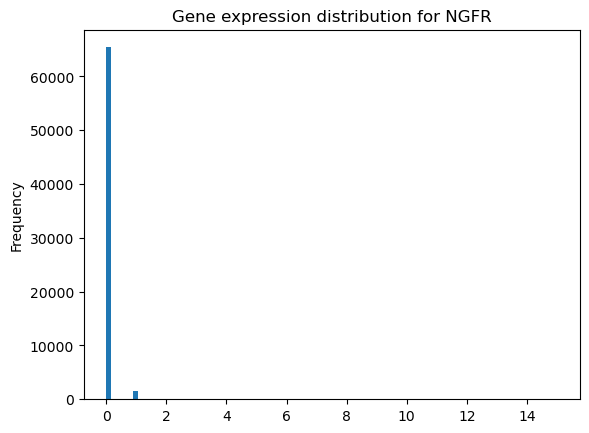

ValueError: You are trying to merge on object and float32 columns. If you wish to proceed you should use pd.concat

In [145]:
sg_obj.show_gene_stats_plots('M')

In [143]:
sg_obj.gdf['cell_id'] = sg_obj.gdf.index

10433.76776107144


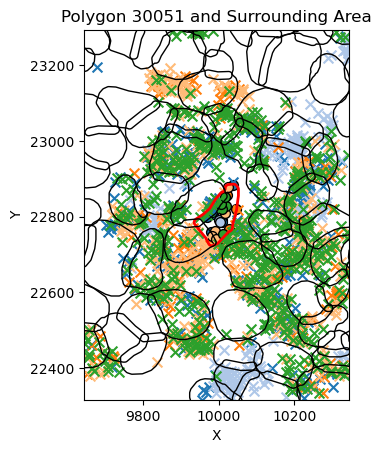

14214.875895915842


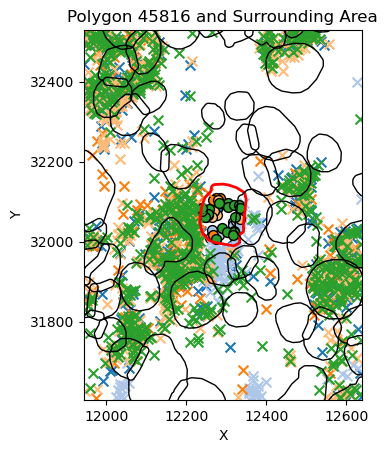

7285.98534451013


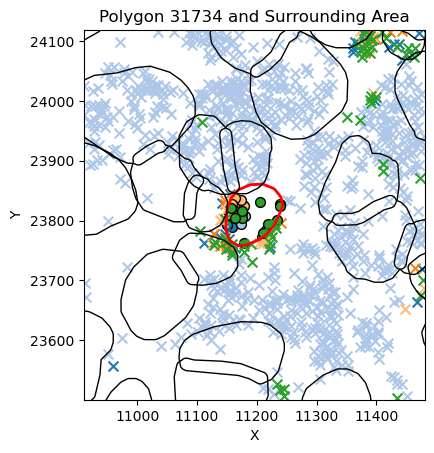

12096.917246945322


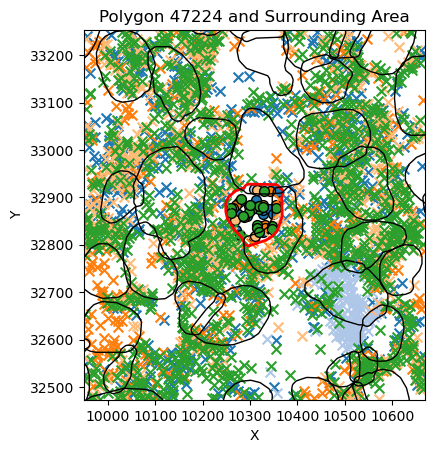

20750.81338438458


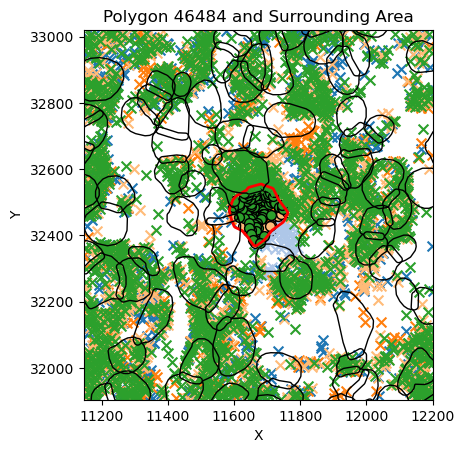

In [52]:
for cell_id in ['30051','45816','31734','47224','46484']:
    # print(cell_id,mapping_dict[cell_id],df[df['cell_id']==cell_id]['called_barcodes'].values[0])

    # print(df[df['cell_id']==cell_id]['area'].values[0])
    # print(adata_genes.obs.loc[cell_id]['total_counts']) 

    print(df[df['cell_id']==cell_id]['area'].values[0])

    # region = get_polygons_around_polygon(sg_obj,cell_id,image_scale=10)

    # gene_names = [    'bc_001','bc_029','bc_031','bc_087']

    # gene_names = ['bc_029']
    gene_names = ['bc_001','bc_024','bc_029','bc_031','bc_087']


    # gene_names = ['bc_024']
        # 'bc_001','bc_029','bc_031','bc_087'



    # gene_names = get_all_barcodes_in_region(df,region['object_id'].values)
    # gene_names.append('SOX10')

    # print(gene_names)

    # gene_names = df[df['cell_id']==cell_id]['called_barcodes'].values[0] + df[df['cell_id']=='60']['called_barcodes'].values[0]

    sg_obj.plot_polygon_and_points(cell_id,gene_names=gene_names,annotate=False,image_scale=5)
    # sg_obj_only_bcs.plot_polygon_and_points(mapping_dict[cell_id],gene_names=gene_names,annotate=False)

KeyError: 'cell_id'

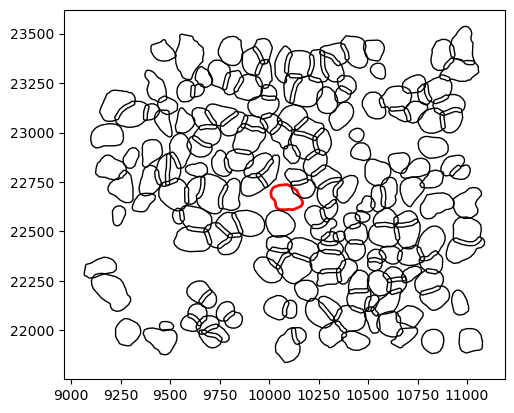

In [82]:
for cell_id in ['29871','27575','32002','31604','49118']:
    # print(cell_id,mapping_dict[cell_id],df[df['cell_id']==cell_id]['called_barcodes'].values[0])

    # print(df[df['cell_id']==cell_id]['area'].values[0])
    # print(adata_genes.obs.loc[cell_id]['total_counts']) 

    # print(df[df['cell_id']==cell_id]['area'].values[0])

    # region = get_polygons_around_polygon(sg_obj,cell_id,image_scale=100)

    # gene_names = [    'bc_001','bc_029','bc_031','bc_087']

    gene_names = ['bc_029']
        # 'bc_001','bc_029','bc_031','bc_087'



    # gene_names = get_all_barcodes_in_region(df,region['object_id'].values)
    # gene_names.append('SOX10')

    # print(gene_names)

    # gene_names = df[df['cell_id']==cell_id]['called_barcodes'].values[0] + df[df['cell_id']=='60']['called_barcodes'].values[0]

    sg_obj.plot_polygon_and_points(cell_id,gene_names=gene_names,annotate=False,image_scale=10,id_field='cell_id')
    # sg_obj_only_bcs.plot_polygon_and_points(mapping_dict[cell_id],gene_names=gene_names,annotate=False)

15274.585523786


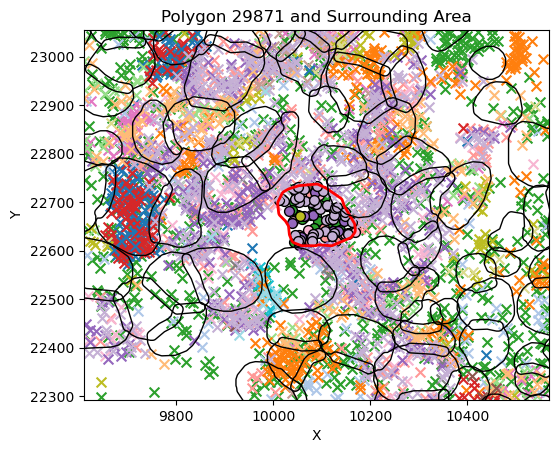

7231.212595232456


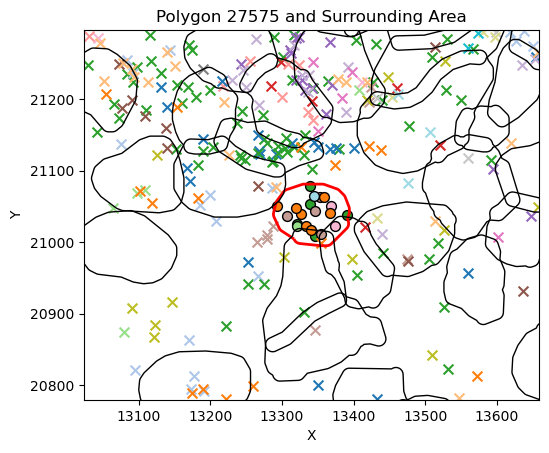

9646.975823093984


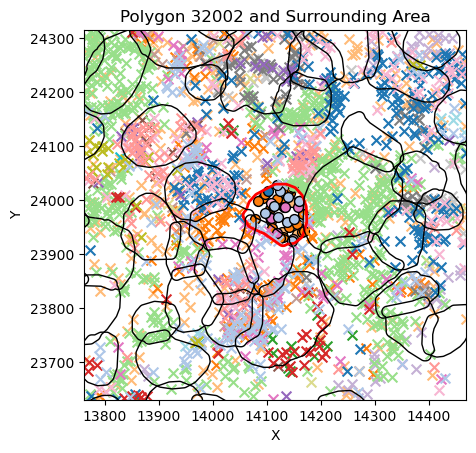

5402.674845402758


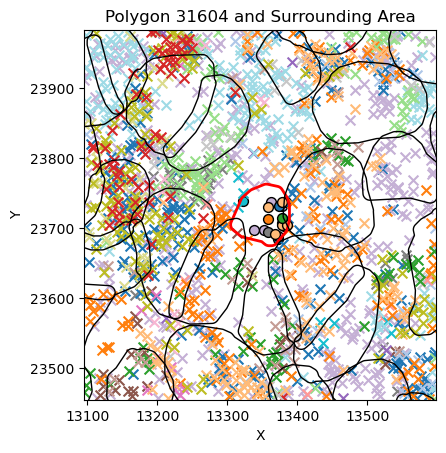

In [185]:
for cell_id in ['29871','27575','32002','31604']:
    # print(cell_id,mapping_dict[cell_id],df[df['cell_id']==cell_id]['called_barcodes'].values[0])

    print(df[df['cell_id']==cell_id]['area'].values[0])

    region = get_polygons_around_polygon(sg_obj,cell_id,image_scale=5)

    gene_names = ['bc_041','bc_066','bc_080','bc_093','SOX10']

    gene_names = get_all_barcodes_in_region(df,region['object_id'].values)
    gene_names.append('SOX10')

    # print(gene_names)

    # gene_names = df[df['cell_id']==cell_id]['called_barcodes'].values[0] + df[df['cell_id']=='60']['called_barcodes'].values[0]

    sg_obj.plot_polygon_and_points(cell_id,gene_names=gene_names,annotate=False,image_scale=5)
    # sg_obj_only_bcs.plot_polygon_and_points(mapping_dict[cell_id],gene_names=gene_names,annotate=False)

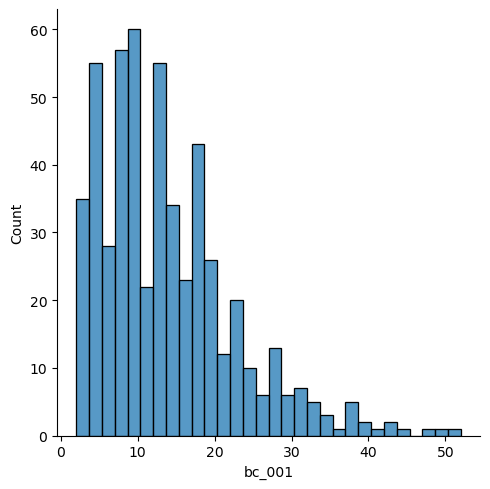

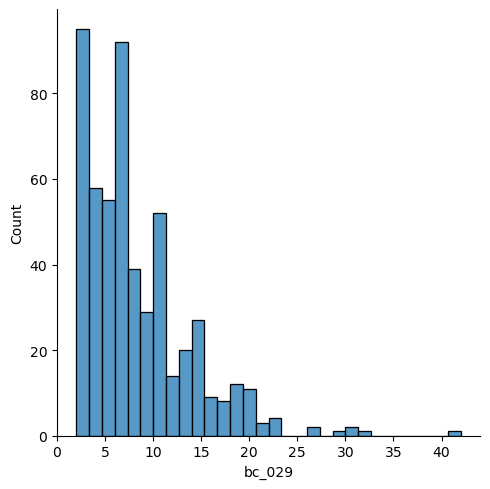

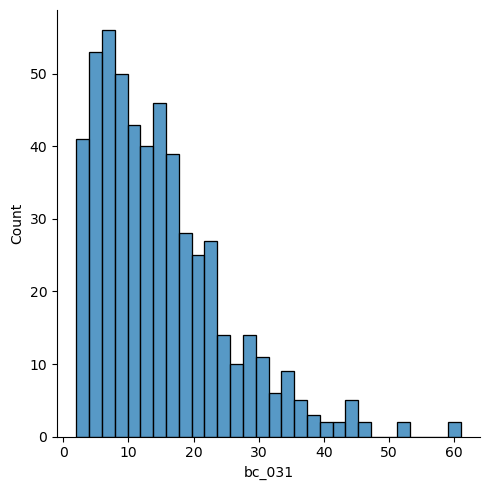

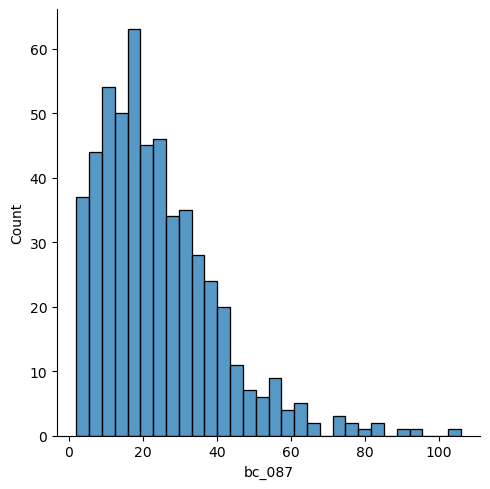

In [65]:
correctly_found = adata_genes.obs[adata_genes.obs['barcode_names'].isin([
    'bc_001-bc_029-bc_031-bc_087'])]['cell_id'].values

bc_list = ['bc_001','bc_029','bc_031','bc_087']
for bc in bc_list:
    sns.displot(df[df['cell_id'].isin(correctly_found)][bc],bins=30)


In [58]:
adata_genes.obs[adata_genes.obs['barcode_names'].isin([
    'bc_001-bc_031-bc_087'])]

,cell_id,n_called_barcodes,barcode_names,called_barcodes,area,center_x,center_y,n_genes_by_counts,total_counts,n_genes,leiden,g2m_score,leiden_res_0.01,leiden_res_0.05,leiden_res_0.10,leiden_res_0.25,leiden_res_0.50,leiden_res_1.00
object_id,,,,,,,,,,,,,,,,,,
27575,27575,3,bc_001-bc_031-bc_087,"[bc_001, bc_031, bc_087]",7231.212595,13342.538047,21039.330527,NaN,NaN,32,30,1.077337,0,0,0,1,17,28
30163,30163,3,bc_001-bc_031-bc_087,"[bc_001, bc_031, bc_087]",7225.559118,11123.323021,22830.067282,NaN,NaN,30,0,-0.670874,0,0,0,0,0,6
31604,31604,3,bc_001-bc_031-bc_087,"[bc_001, bc_031, bc_087]",5402.674845,13351.074080,23719.160682,NaN,NaN,30,10,0.159396,0,0,0,5,11,14
32002,32002,3,bc_001-bc_031-bc_087,"[bc_001, bc_031, bc_087]",9646.975823,14121.476876,23975.224758,NaN,NaN,38,24,-0.261644,0,0,0,0,13,12
33548,33548,3,bc_001-bc_031-bc_087,"[bc_001, bc_031, bc_087]",5836.715076,16651.381151,24891.331351,NaN,NaN,18,2,0.225386,0,0,0,0,0,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49118,49118,3,bc_001-bc_031-bc_087,"[bc_001, bc_031, bc_087]",8929.192248,11961.550973,34026.117058,NaN,NaN,50,5,0.504875,0,0,0,1,1,3
49381,49381,3,bc_001-bc_031-bc_087,"[bc_001, bc_031, bc_087]",9187.150848,9975.787002,34178.679823,NaN,NaN,38,12,0.196116,0,0,0,0,0,13
49743,49743,3,bc_001-bc_031-bc_087,"[bc_001, bc_031, bc_087]",18947.806126,11745.552544,34417.158836,NaN,NaN,63,0,0.196747,0,0,0,0,0,6


7225.559118143488


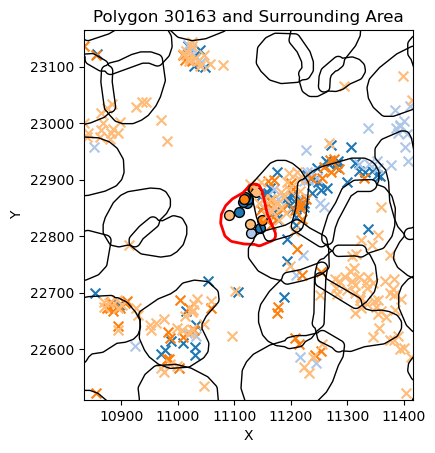

8162.6736670202545


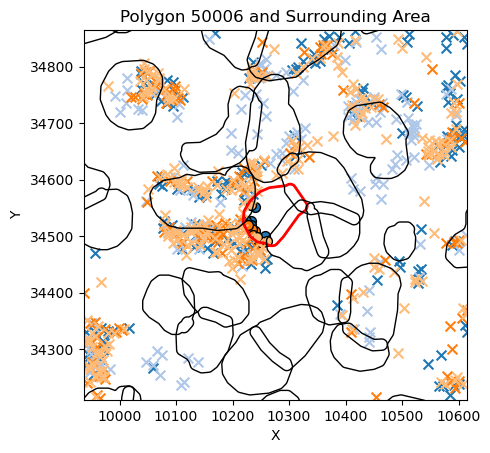

5836.715075873082


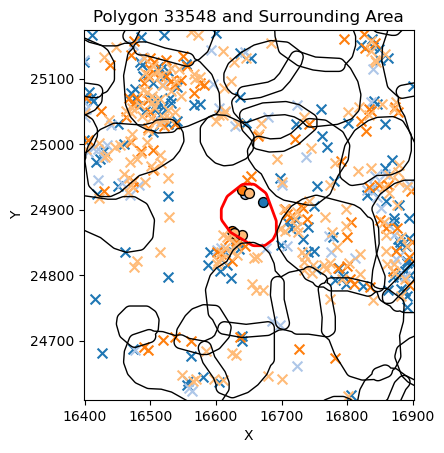

18947.80612600914


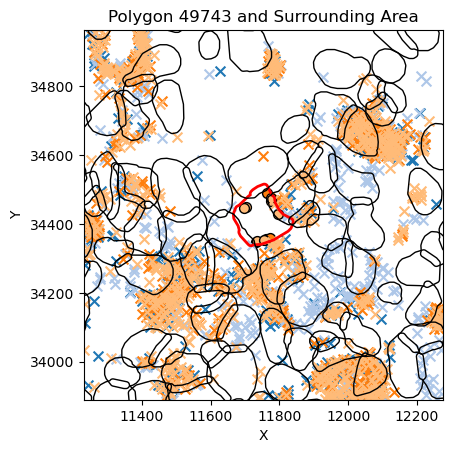

8929.192247640298


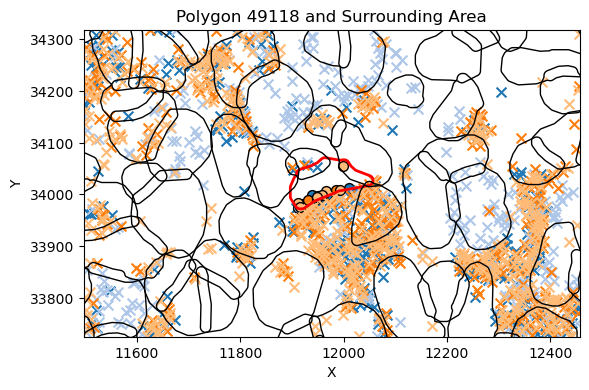

In [63]:
for cell_id in ['30163','50006','33548','49743','49118']:
    # print(cell_id,mapping_dict[cell_id],df[df['cell_id']==cell_id]['called_barcodes'].values[0])

    # print(df[df['cell_id']==cell_id]['area'].values[0])
    # print(adata_genes.obs.loc[cell_id]['total_counts']) 

    print(df[df['cell_id']==cell_id]['area'].values[0])

    # region = get_polygons_around_polygon(sg_obj,cell_id,image_scale=10)

    # gene_names = [    'bc_001','bc_029','bc_031','bc_087']

    # gene_names = ['bc_029']
    gene_names = ['bc_001','bc_029','bc_031','bc_087']


    # gene_names = ['bc_024']
        # 'bc_001','bc_029','bc_031','bc_087'



    # gene_names = get_all_barcodes_in_region(df,region['object_id'].values)
    # gene_names.append('SOX10')

    # print(gene_names)

    # gene_names = df[df['cell_id']==cell_id]['called_barcodes'].values[0] + df[df['cell_id']=='60']['called_barcodes'].values[0]

    sg_obj.plot_polygon_and_points(cell_id,gene_names=gene_names,annotate=False,image_scale=5)
    # sg_obj_only_bcs.plot_polygon_and_points(mapping_dict[cell_id],gene_names=gene_names,annotate=False)

In [155]:
# Let's unpack the bc041-bc066-bc093 barcode combo which is next to a bunch of bc041-bc066-bc080-bc093 cells and see what's going on there
df[df['barcode_names'].isin(['bc_041-bc_066-bc_093','bc_041-bc_066-bc_080-bc_093'])][['barcode_names','bc_041','bc_066','bc_080','bc_093']]

,barcode_names,bc_041,bc_066,bc_080,bc_093
object_id,,,,,
17598,bc_041-bc_066-bc_093,3.0,3.0,1.0,3.0
17632,bc_041-bc_066-bc_093,7.0,6.0,1.0,8.0
17675,bc_041-bc_066-bc_080-bc_093,12.0,2.0,3.0,5.0
17749,bc_041-bc_066-bc_080-bc_093,4.0,4.0,2.0,12.0
17714,bc_041-bc_066-bc_080-bc_093,15.0,10.0,4.0,16.0
...,...,...,...,...,...
22805,bc_041-bc_066-bc_080-bc_093,6.0,7.0,5.0,13.0
22982,bc_041-bc_066-bc_080-bc_093,9.0,4.0,2.0,5.0
23122,bc_041-bc_066-bc_080-bc_093,3.0,6.0,9.0,4.0


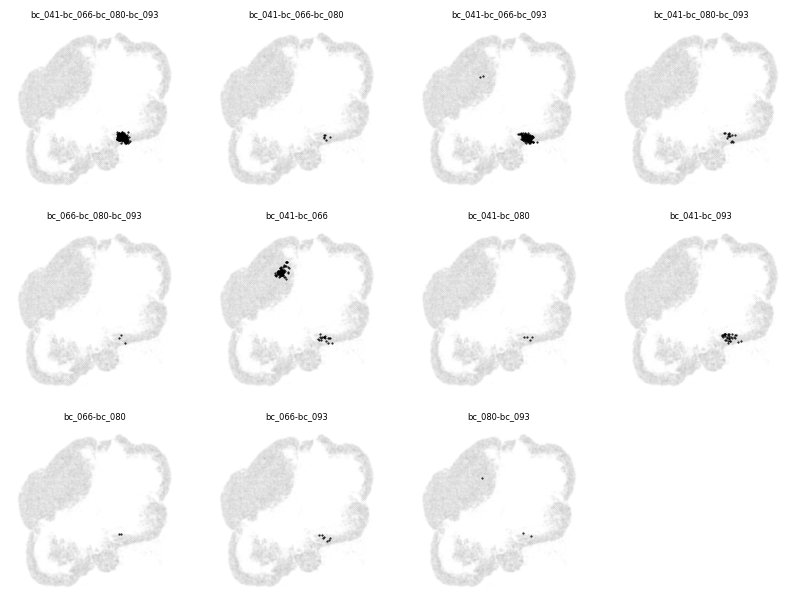

In [156]:
bc_list = ['bc_041','bc_066','bc_080','bc_093']

# import  as comb
bcs_here = []
bcs_here.append('-'.join(bc_list))
for c in itertools.combinations(bc_list,3):
    bcs_here.append('-'.join(c))

for c in itertools.combinations(bc_list,2):
    bcs_here.append('-'.join(c))

plt.figure(figsize=(10,10))
for i,bc_name in enumerate(bcs_here):
    
    plt.subplot(4,4,i+1)
    plt.title(bc_name,fontsize=6)

    others = adata_genes[adata_genes.obs['barcode_names']!=bc_name]
    plt.scatter(others.obs['center_x'],others.obs['center_y'],marker='o',
            color='gray',alpha=0.01,
            s=0.1)

    this_bc = adata_genes[adata_genes.obs['barcode_names']==bc_name]

    plt.scatter(this_bc.obs['center_x'],this_bc.obs['center_y'],marker='o',
            color='k',alpha=1.0,
            s=0.25)
    
    plt.axis('off')

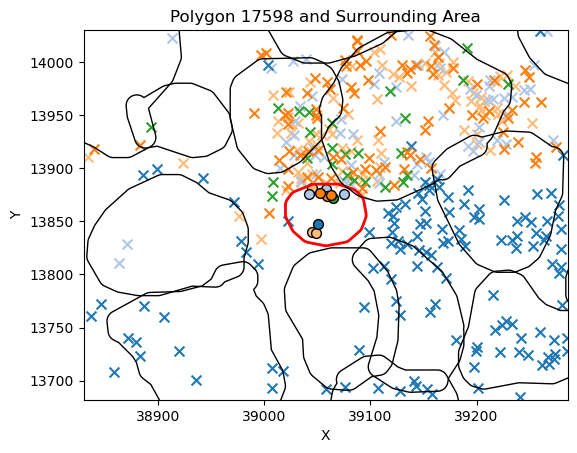

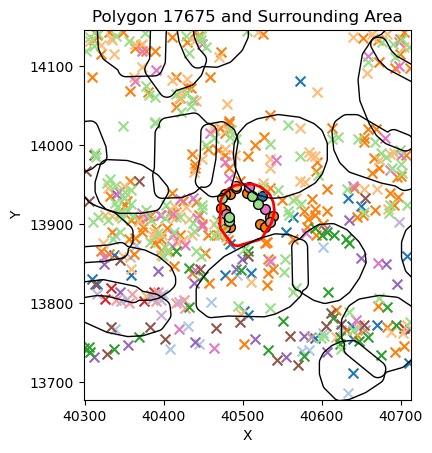

In [176]:
for cell_id in ['17598','17675']:
    # print(cell_id,mapping_dict[cell_id],df[df['cell_id']==cell_id]['called_barcodes'].values[0])

    region = get_polygons_around_polygon(sg_obj,cell_id,image_scale=5)

    gene_names = ['bc_041','bc_066','bc_080','bc_093']

    gene_names = get_all_barcodes_in_region(df,region['object_id'].values)

    # print(gene_names)

    # gene_names = df[df['cell_id']==cell_id]['called_barcodes'].values[0] + df[df['cell_id']=='60']['called_barcodes'].values[0]

    sg_obj.plot_polygon_and_points(cell_id,gene_names=gene_names,annotate=False,image_scale=5)
    # sg_obj_only_bcs.plot_polygon_and_points(mapping_dict[cell_id],gene_names=gene_names,annotate=False)

In [ ]:
## Do cells with the same barcode tend to belong to one cluster or the other?"

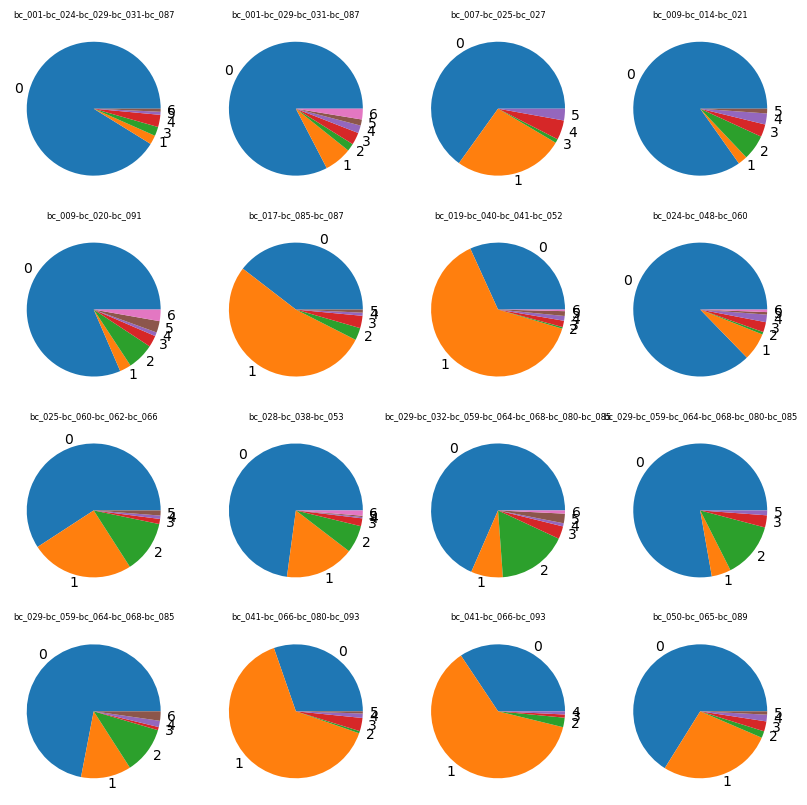

In [504]:

plt.figure(figsize=(10,10))
for i,bc_name in enumerate(very_common_bcs):
    
    plt.subplot(4,4,i+1)
    plt.title(bc_name,fontsize=6)

    # others = adata_genes[adata_genes.obs['barcode_names']!=bc_name]
    # plt.scatter(others.obs['center_x'],others.obs['center_y'],marker='o',
    #         color='gray',alpha=0.01,
    #         s=0.1)

    this_bc = adata_genes[adata_genes.obs['barcode_names']==bc_name]

    clusters,sizes = np.unique(this_bc.obs[f'leiden_res_{res_to_use:4.2f}'],return_counts=True)

    plt.pie(sizes,labels=clusters)

    
    # plt.subplot(4,4,i+1)
    # plt.title(bc_name,fontsize=6)

    # others = adata_genes[adata_genes.obs['barcode_names']!=bc_name]
    # plt.scatter(others.obs['center_x'],others.obs['center_y'],marker='o',
    #         color='gray',alpha=0.01,
    #         s=0.1)

    

    # plt.scatter(this_bc.obs['center_x'],this_bc.obs['center_y'],marker='o',
    #         color=bc_color_dict[bc_name],alpha=1.0,
    #         s=0.25)
    
    # plt.axis('off')

In [516]:
bcs,counts= np.unique(adata_genes[adata_genes.obs['leiden_res_0.25']=='6'].obs['barcode_names'],return_counts=True)
[(b,c) for b,c in zip(bcs,counts) if (c>3 and b != '')]
          

[('bc_001-bc_029-bc_031-bc_087', 14),
 ('bc_001-bc_031-bc_087', 4),
 ('bc_002', 5),
 ('bc_009-bc_091', 4),
 ('bc_022', 15),
 ('bc_025-bc_079-bc_083', 5),
 ('bc_028-bc_038-bc_053', 4),
 ('bc_050', 4)]

In [519]:
bcs,counts= np.unique(adata_genes[adata_genes.obs['leiden_res_0.25']=='5'].obs['barcode_names'],return_counts=True)
[(b,c) for b,c in zip(bcs,counts) if (c>3 and b != '')]

[('bc_001-bc_029-bc_031-bc_087', 8),
 ('bc_020', 4),
 ('bc_022', 4),
 ('bc_048-bc_060', 4),
 ('bc_050', 9),
 ('bc_060', 4)]

In [515]:
bcs,counts= np.unique(adata_genes[adata_genes.obs['leiden_res_0.25']=='3'].obs['barcode_names'],return_counts=True)
[(b,c) for b,c in zip(bcs,counts) if (c>3 and b != '')]

[('bc_001', 7),
 ('bc_001-bc_029-bc_031-bc_087', 16),
 ('bc_002', 6),
 ('bc_002-bc_094', 5),
 ('bc_004-bc_050', 4),
 ('bc_006-bc_019-bc_064-bc_094', 4),
 ('bc_007-bc_013-bc_054-bc_060', 4),
 ('bc_009', 6),
 ('bc_009-bc_014-bc_021', 8),
 ('bc_009-bc_091', 7),
 ('bc_010-bc_060-bc_081', 4),
 ('bc_013-bc_060', 4),
 ('bc_017-bc_085-bc_087', 4),
 ('bc_019-bc_040-bc_041-bc_052', 4),
 ('bc_020', 11),
 ('bc_022', 26),
 ('bc_022-bc_033', 4),
 ('bc_024', 9),
 ('bc_024-bc_048-bc_060', 4),
 ('bc_025', 5),
 ('bc_028-bc_038-bc_053', 6),
 ('bc_029-bc_032-bc_059-bc_064-bc_068-bc_080-bc_085', 4),
 ('bc_029-bc_059-bc_064-bc_068-bc_080-bc_085', 5),
 ('bc_030-bc_040-bc_058-bc_059-bc_083-bc_095', 7),
 ('bc_033', 5),
 ('bc_033-bc_095', 7),
 ('bc_041-bc_045-bc_047-bc_052', 4),
 ('bc_041-bc_066-bc_080-bc_093', 6),
 ('bc_045', 7),
 ('bc_048-bc_060', 9),
 ('bc_050', 19),
 ('bc_052-bc_068', 4),
 ('bc_058-bc_083', 9),
 ('bc_060', 6),
 ('bc_060-bc_081', 12),
 ('bc_063', 6),
 ('bc_073', 5),
 ('bc_074', 6),
 ('bc_074

In [1]:
import itertools

In [87]:
dist = scipy.spatial.distance.pdist(df[barcode_cols].values,'braycurtis')   

KeyboardInterrupt: 

In [99]:
# looking for intrinsic genes

KeyError: 'leiden_res_0.25'

In [150]:
dominant_genes = ['VEGFA','COL1A1','MITF','CAPG','COL5A2','BGN']

sc.tl.score_genes(adata_genes,cell_cycle_genes,score_name='dominant_score')

/Users/grantkinsler/miniforge3/envs/spatialgenomics-env2/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


/Users/grantkinsler/miniforge3/envs/spatialgenomics-env2/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  cax = scatter(


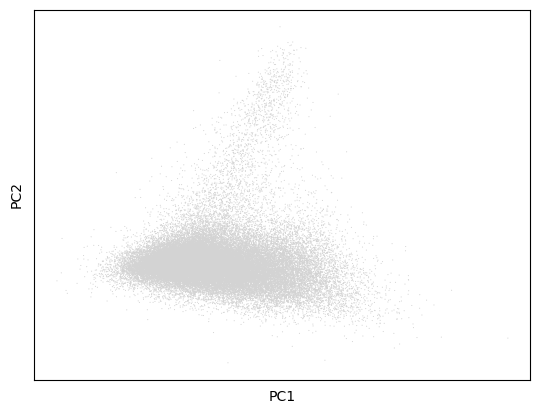

In [159]:
sc.pp.regress_out(adata_genes, ['dominant_score'])
sc.pp.scale(adata_genes)
sc.pp.pca(adata_genes)
sc.pl.pca(adata_genes)

In [160]:
sc.pp.neighbors(adata_genes)
# sc.pp.scale(adata_genes)
sc.tl.umap(adata_genes)
# sc.tl.leiden(adata_genes, n_iterations=-1)

In [161]:
res_list = [0.01,0.05,0.1,0.25, 0.5, 1.0]
for res in res_list:
    sc.tl.leiden(
        adata_genes, key_added=f"leiden_res_nodominant_{res:4.2f}", resolution=res, random_state=42
    )


/Users/grantkinsler/miniforge3/envs/spatialgenomics-env2/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/grantkinsler/miniforge3/envs/spatialgenomics-env2/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/grantkinsler/miniforge3/envs/spatialgenomics-env2/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/grantkinsler/miniforge3/envs/spatialgenomics-env2/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/grantkinsler/miniforge3/envs/spatialgenomics-env2

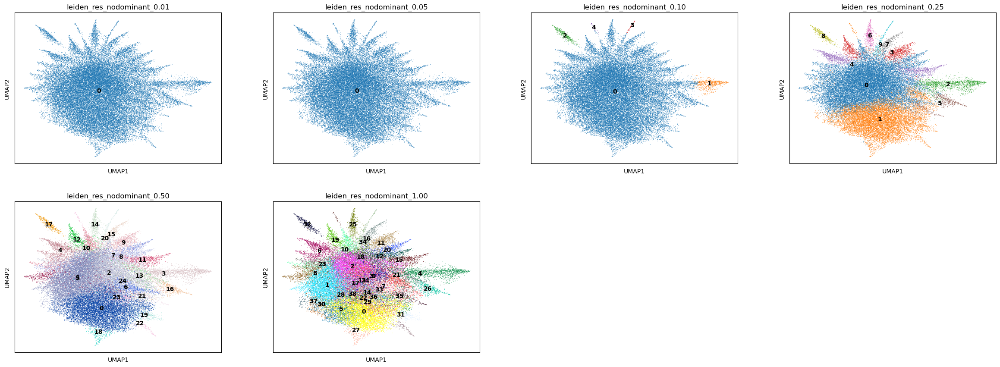

In [162]:
sc.pl.umap(
    adata_genes,
    color=[f"leiden_res_nodominant_{res:4.2f}" for res in res_list],
    legend_loc="on data",
)

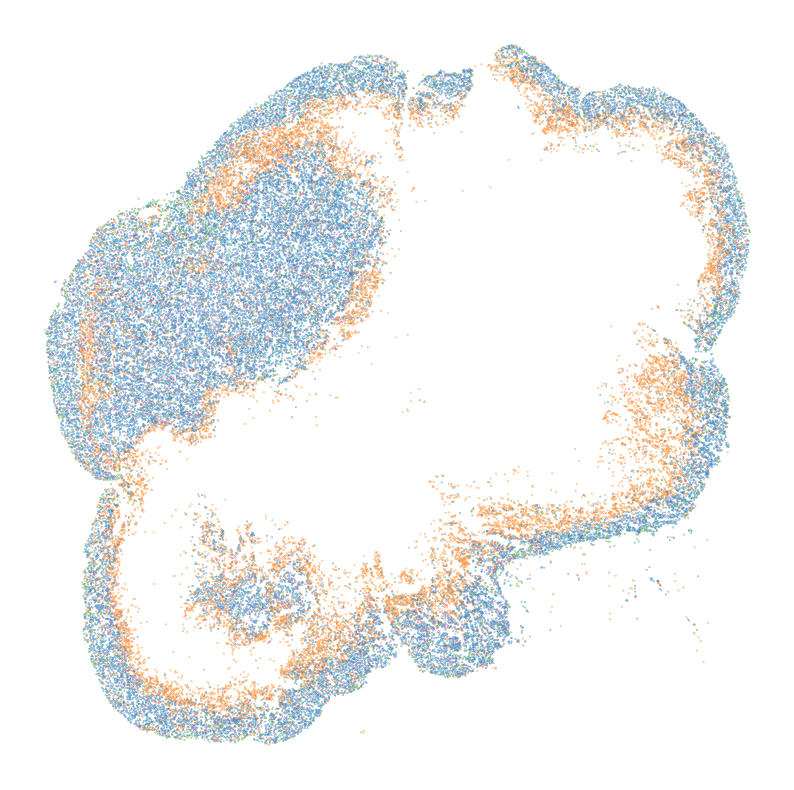

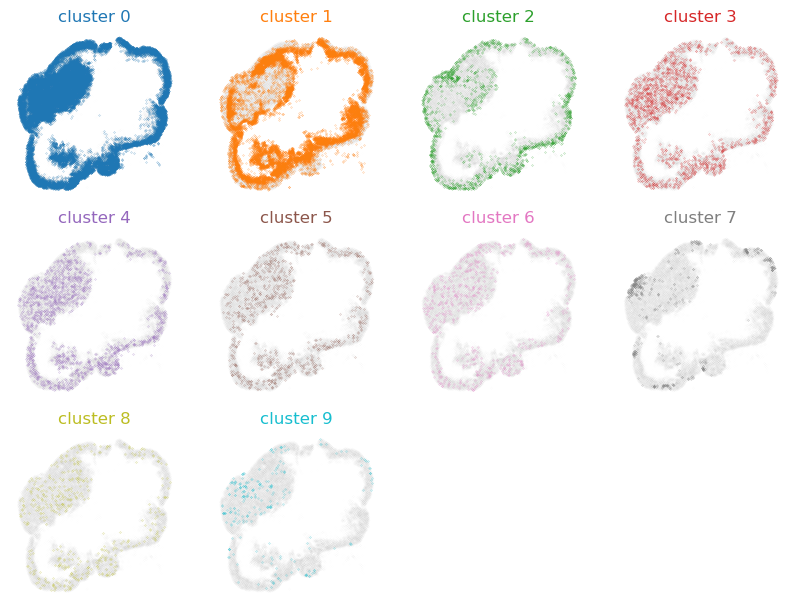

In [165]:
res_to_use = 0.25

leiden_name = f'leiden_res_nodominant_{res_to_use:4.2f}'

c_dict = {str(x):c for x,c in enumerate(adata_genes.uns[f'{leiden_name}_colors'])}
c_list =[c_dict[x] for x in adata_genes.obs[f'{leiden_name}']]

fig,ax = plt.subplots(1,1,figsize=(10,10))
plt.scatter(adata_genes.obs['center_x'],adata_genes.obs['center_y'],marker='.',
            c=c_list,
            s=0.2)
plt.axis('off')

plt.figure(figsize=(10,10))
for cluster in np.unique(adata_genes.obs[f'{leiden_name}']):
    plt.subplot(4,4,int(cluster)+1)
    plt.title(f'cluster {cluster}',color=c_dict[str(cluster)])
    not_cluster = adata_genes[adata_genes.obs[f'{leiden_name}']!=str(cluster)]
    plt.scatter(not_cluster.obs['center_x'],not_cluster .obs['center_y'],marker='.',
                c='gray',
                s=0.1,alpha=0.01)
    
    this_cluster = adata_genes[adata_genes.obs[f'{leiden_name}']==str(cluster)]
    plt.scatter(this_cluster.obs['center_x'],this_cluster.obs['center_y'],marker='.',
                c=c_dict[str(cluster)],
                s=0.1)
    plt.axis('off')
    

In [168]:
sc.tl.rank_genes_groups(adata_genes, groupby=f'{leiden_name}', method="wilcoxon")

sc.pl.rank_genes_groups_dotplot(
    adata_genes, groupby='leiden_res_nodominant_0.25', standard_scale="var", n_genes=3
)

/Users/grantkinsler/miniforge3/envs/spatialgenomics-env2/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/grantkinsler/miniforge3/envs/spatialgenomics-env2/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/grantkinsler/miniforge3/envs/spatialgenomics-env2/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/grantkinsler/miniforge3/envs/spatialgenomics-env2/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/grantkinsler/miniforge3/envs/spatialgenomics-env2/lib/python3.9/site-packages

ValueError: Incompatible observations. Dendrogram data has 9 categories but current groupby observation ['leiden_res_nodominant_0.25'] contains 10 categories. Most likely the underlying groupby observation changed after the initial computation of `sc.tl.dendrogram`. Please run `sc.tl.dendrogram` again.'

In [167]:
adata_genes

AnnData object with n_obs × n_vars = 49625 × 119
    obs: 'cell_id', 'n_called_barcodes', 'barcode_names', 'called_barcodes', 'area', 'center_x', 'center_y', 'n_genes_by_counts', 'total_counts', 'n_genes', 'leiden', 'g2m_score', 'dominant_score', 'leiden_res_nodominant_0.01', 'leiden_res_nodominant_0.05', 'leiden_res_nodominant_0.10', 'leiden_res_nodominant_0.25', 'leiden_res_nodominant_0.50', 'leiden_res_nodominant_1.00'
    var: 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'mean', 'std'
    uns: 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'leiden_res_nodominant_0.01_colors', 'leiden_res_nodominant_0.05_colors', 'leiden_res_nodominant_0.10_colors', 'leiden_res_nodominant_0.25_colors', 'leiden_res_nodominant_0.50_colors', 'leiden_res_nodominant_1.00_colors', 'rank_genes_groups', 'dendrogram_leiden_res_nodominant_0.25'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'